In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import solve
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

plt.rcParams['axes.linewidth'] = 3.0

hbar = 1.05457182e-34 # meters^2 kg/s
m_elec = 9.109e-31 # kg

In [3]:
def solve_schrod_cn(phi_init,L,N_slices,h,N_time_slices):
    # the phi vector should have entries from a*1,t to a*(N_slices-1),t since a*N_slices,t and a*0 are the boundaries where the wf goes to 0; so N-1 entries in total
    a = L/N_slices
    a1 = complex(1, (h*hbar)/(2*m_elec*(a**2)))
    a2 = complex(0, -(h*hbar)/(4*m_elec*(a**2)))
    b1 = complex(1, -(h*hbar)/(2*m_elec*(a**2)))
    b2 = complex(0, (h*hbar)/(4*m_elec*(a**2)))

    a_matrix = np.zeros((N_slices-1,N_slices-1),complex)
    b_matrix = np.zeros((N_slices-1,N_slices-1),complex)

    phi_init_vec = np.zeros(N_slices-1,complex)

    for i in range(N_slices-1):
        phi_init_vec[i] = phi_init(x=(i+1)*a)
        for j in range(N_slices-1):
            if j == i:
                a_matrix[i,j] = a1
                b_matrix[i,j] = b1
            elif j == (i-1) or j == (i+1):
                a_matrix[i,j] = a2
                b_matrix[i,j] = b2
            else:
                a_matrix[i,j] = 0
                b_matrix[i,j] = 0

    phi_vec_of_t = np.copy(phi_init_vec)

    phi_of_t_list = []
    timestep_list = []
    phi_of_t_list.append(phi_vec_of_t)
    timestep_list.append(0*h)

    for i in range(N_time_slices):
        bphi = np.matmul(b_matrix,phi_vec_of_t)
        phi_vec_of_t = solve(a_matrix,bphi)
        phi_of_t_list.append(phi_vec_of_t)
        timestep_list.append((i+1)*h)

    return phi_of_t_list,timestep_list


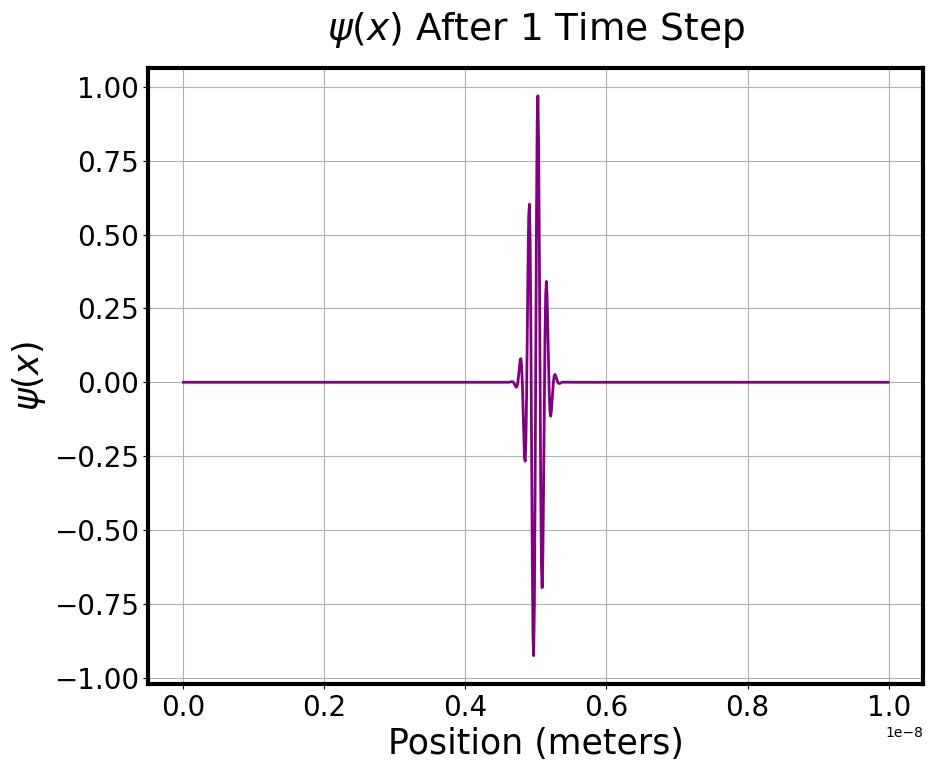

In [28]:
L = 1e-8 # meters
sigma = 1e-10 # meters
x0 = L/2
kappa = 5e10 # meters^-1
phi_initial = lambda x: np.exp(-((x-x0)**2)/(2*(sigma**2))) * np.exp(complex(0,kappa*x))

h = 1e-18
N = 1000

phi_of_t_list,timestep_list = solve_schrod_cn(phi_init=phi_initial,L=L,N_slices=N,h=h,N_time_slices=1)
x_range = np.linspace(a, L-a, N-1)

plt.figure(figsize=(10,8),dpi=100)
plt.plot(x_range,np.real(phi_of_t_list[1]),lw=2,color='purple')
plt.xlabel(r'Position (meters)',fontsize=25)
plt.ylabel(r'$\psi(x)$',fontsize=25)
plt.title(r'$\psi(x)$ After 1 Time Step',fontsize=27,pad='20')
plt.grid(True,which='both')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.tick_params(labelbottom=True)
plt.tick_params(labelleft=True)
plt.savefig(f'./hw5_p1_1step',bbox_inches="tight")
plt.show()

In [10]:
t_slices=5000

phi_of_t_list_2,timestep_list_2 = solve_schrod_cn(phi_init=phi_initial,L=L,N_slices=N,h=h,N_time_slices=t_slices)


In [32]:
plt.rcParams['animation.embed_limit'] = 10.0 

a = L/N
x_range = np.linspace(a, L-a, N-1)
clean_data = [np.real(arr) for arr in phi_of_t_list_2]

y_min = np.min([np.min(d) for d in clean_data])
y_max = np.max([np.max(d) for d in clean_data])
pad = (y_max - y_min) * 0.1

fig, ax = plt.subplots(figsize=(10, 8))
ax.set_xlim(a, L-a)
ax.set_ylim(y_min - pad, y_max + pad)
ax.set_xlabel(r'Position (meters)',fontsize=23)
ax.set_ylabel(r'$\psi(x)$',fontsize=23)
ax.set_title(r'$\psi(x)$ Over ' + f'{t_slices} Time-steps',fontsize=23, pad=15)
ax.tick_params(axis='both', which='major', labelsize=15)

line, = ax.plot([], [], lw=2, color='purple')
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes,fontsize=23)

def update(frame_index):
    y_data = clean_data[frame_index]
    line.set_data(x_range, y_data)
    current_time = frame_index * h
    time_text.set_text(f'Time: {current_time:.2e} s')
    return line, time_text

skip = 50
anim = FuncAnimation(fig, update, frames=range(0, len(clean_data),skip),
                     blit=True, interval=30)

anim.save("schrodinger.gif", writer='pillow', fps=30)

plt.close()
HTML(anim.to_jshtml())

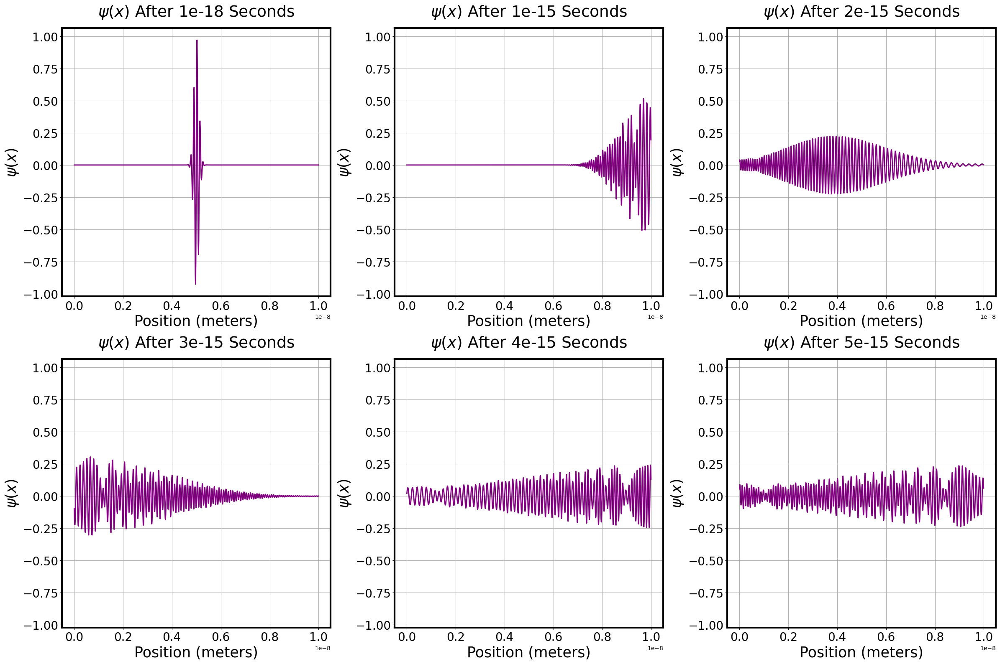

In [29]:
# Some extra code to plot some snapshots from the time evolution

def plot_six_arrays(array_list,timestep_list):
    if len(array_list) != 6:
        raise ValueError("The input list must contain exactly 6 arrays.")

    all_values = np.concatenate([np.real(arr) for arr in array_list])
    global_min = np.min(all_values)
    global_max = np.max(all_values)

    margin = (global_max - global_min) * 0.05
    y_limits = (global_min - margin, global_max + margin)

    fig, axes = plt.subplots(2, 3, figsize=(24, 16), dpi=100)
    ax_flat = axes.flatten()

    for i, ax in enumerate(ax_flat):
        data = array_list[i]
        ax.plot(x_range,np.real(data), lw=2, color='purple')
        ax.set_ylim(y_limits)
        ax.set_xlabel(r'Position (meters)', fontsize=25)
        ax.set_ylabel(r'$\psi(x)$', fontsize=25)
        ax.set_title(rf'$\psi(x)$ After {timestep_list[i]*h:.0e} Seconds', fontsize=27, pad=20)
        ax.grid(True, which='both')
        ax.tick_params(axis='both', which='major', labelsize=20)
        ax.tick_params(labelbottom=True, labelleft=True)

    plt.tight_layout()
    plt.savefig(f'./hw5_p1_6_slices',bbox_inches="tight")
    plt.show()

arrays = [phi_of_t_list_2[1],phi_of_t_list_2[1000],phi_of_t_list_2[2000],phi_of_t_list_2[3000],phi_of_t_list_2[4000],phi_of_t_list_2[5000]]
timestep_list = [1,1000,2000,int(3000),4000,5000]
plot_six_arrays(arrays,timestep_list)